# Speckles generation

In [1]:
import numpy as np
import numpy.random as rng
import matplotlib.pyplot as plt
import numpy.fft as FT
import scipy.ndimage as nd
from scipy.stats import norm
from video import *
%matplotlib notebook

In [2]:
def canvas2rgb_array(canvas):
    canvas.draw()
    buf = np.frombuffer(canvas.tostring_rgb(), dtype=np.uint8)
    ncols, nrows = canvas.get_width_height()
    scale = round(math.sqrt(buf.size / 3 / nrows / ncols))
    return buf.reshape(scale * nrows, scale * ncols, 3)


1024


<IPython.core.display.Javascript object>


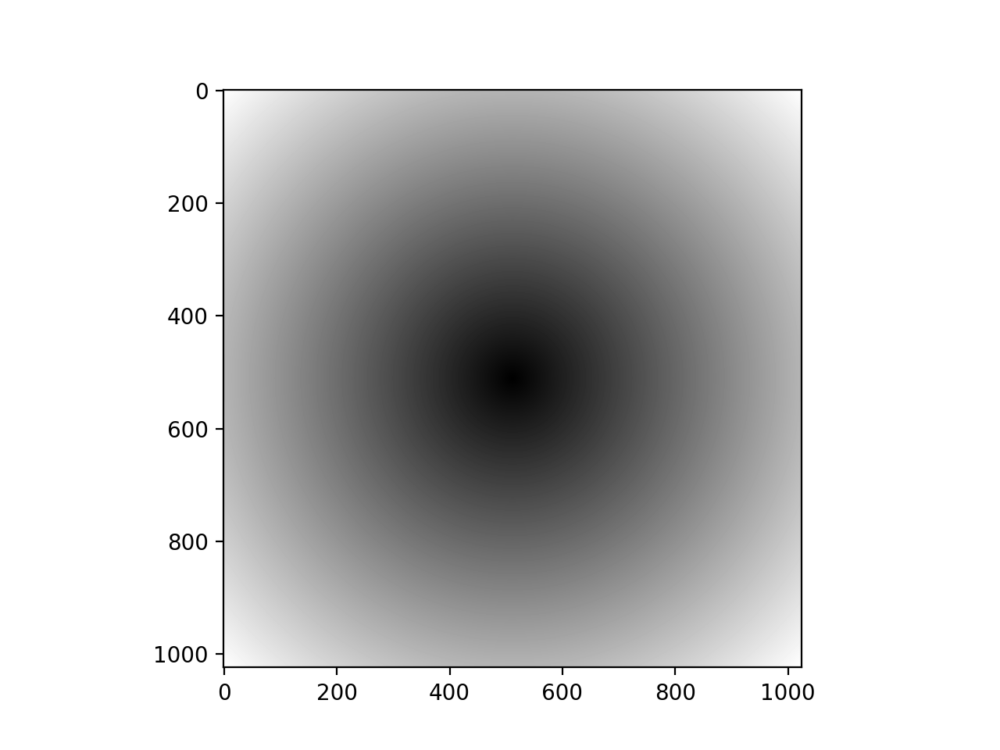

In [3]:
L  = 2**10
X0 = L/16*0
Y0 = L/2*0
Y,X = np.indices((L,L))
X = X - X.mean() - X0
Y = Y - Y.mean() - Y0
RR = np.sqrt(X*X+Y*Y)
print(L)
plt.figure()
plt.imshow(RR,cmap=plt.cm.gray)

## How to generate speckles
Use two complex matrices uniform inside a circle

In [7]:
def specklesAlgorithm(img):
    """
    Modulìus sqaured and shifted pattern
    """
    return FT.fftshift(abs(FT.fft2(img))**2)

def speckles(r0):
    """
    Creation of a single speckle pattern
    A circle centered in 0 is filled with uniform phase numbers
    """
    phi = 2*np.pi*rng.random((L,L))
    img = np.zeros((L,L),dtype = complex)
    img = np.where(RR<r0,np.exp(1j*phi),img)
    return specklesAlgorithm(img)

def speckleFromPhase(r0,phi):
    """
    Creation of speckle pattern from a uniform random phase field
    """
    img = np.zeros((L,L),dtype = complex)
    img = np.where(RR<r0,np.exp(1j*phi),img)
    return specklesAlgorithm(img)

def specklesCorrelated(r0,correlation):
    """
    Generation of correlated speckles.
    """
    phi1 = rng.normal(size = (L,L))
    phi2 = rng.normal(size = (L,L))
    return specklesCorrelatedFromPhase(phi1,phi2,r0,correlation)

def specklesCorrelatedFromPhase(phi1,phi2,r0,correlation):
    """
    Generation of correlated speckles.
    """
    z1 = 1/np.sqrt(2)*(np.sqrt(1+correlation)*phi1 - np.sqrt(1-correlation)*phi2)
    z2 = 1/np.sqrt(2)*(np.sqrt(1+correlation)*phi1 + np.sqrt(1-correlation)*phi2)
    t1 = norm.cdf(z1)
    t2 = norm.cdf(z2)
    print(z1.shape)
    img1 = speckleFromPhase(r0,2*np.pi*t1)
    img2 = speckleFromPhase(r0,2*np.pi*t2)
    return img1,img2

indexCorrelation = lambda x,N = 20,nu = 2: 2*(1-((x-1)/(N-1))**nu)**2-1

In [8]:
phi1 = rng.normal(size = (L,L))
phi2 = rng.normal(size = (L,L))

<IPython.core.display.Javascript object>


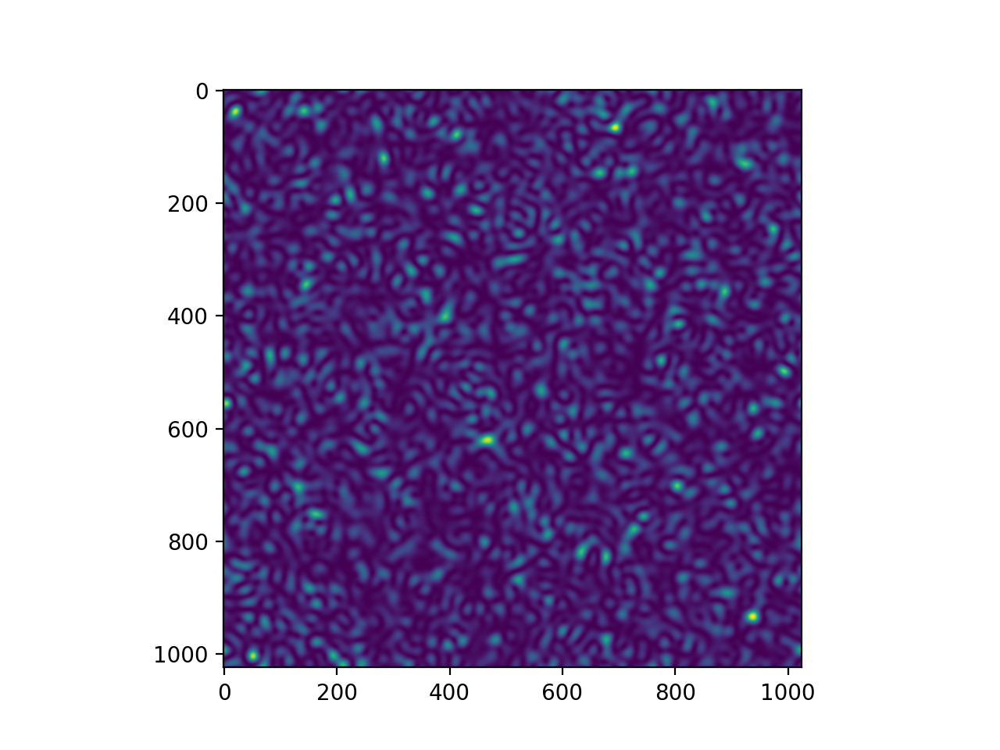

(1024, 1024)


<IPython.core.display.Javascript object>


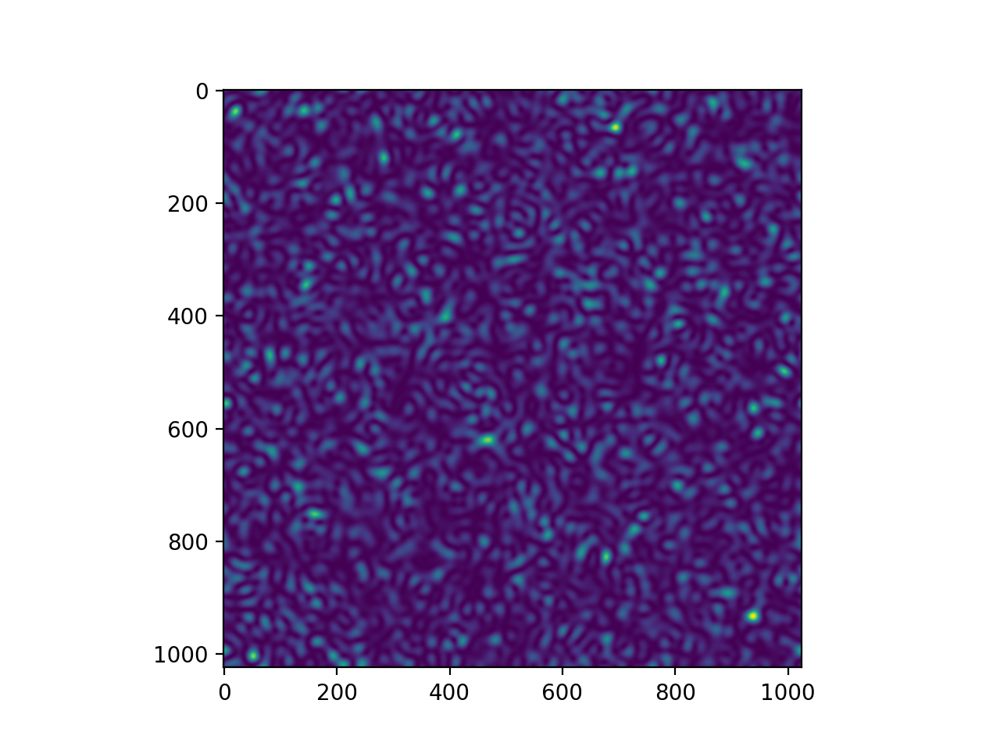

(1024, 1024)


<IPython.core.display.Javascript object>


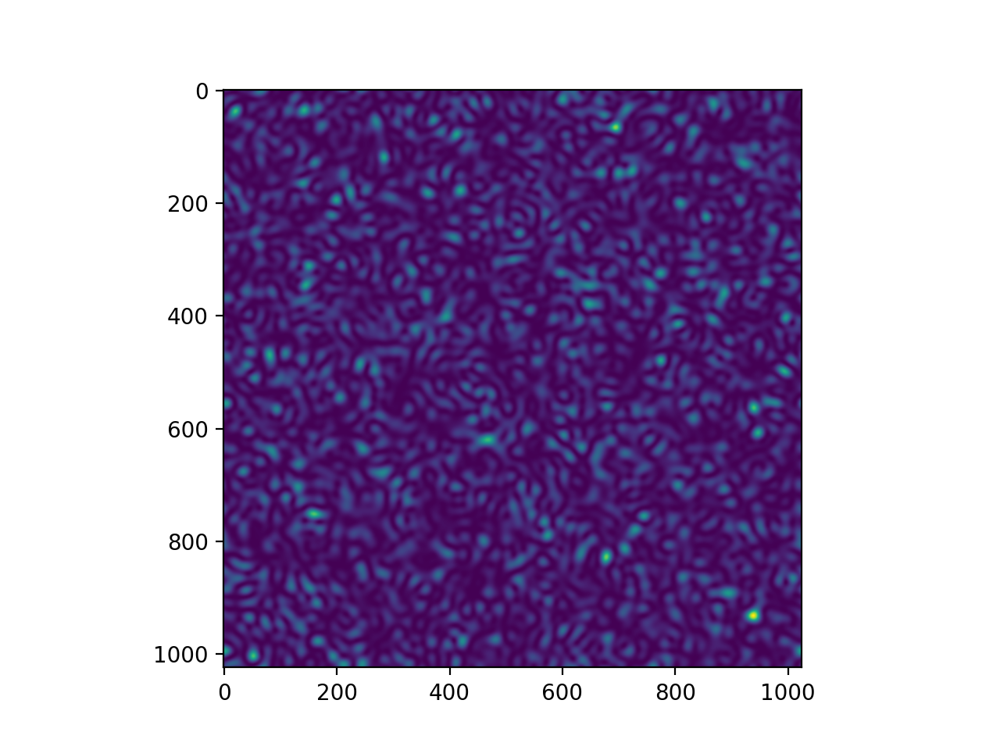

(1024, 1024)


<IPython.core.display.Javascript object>


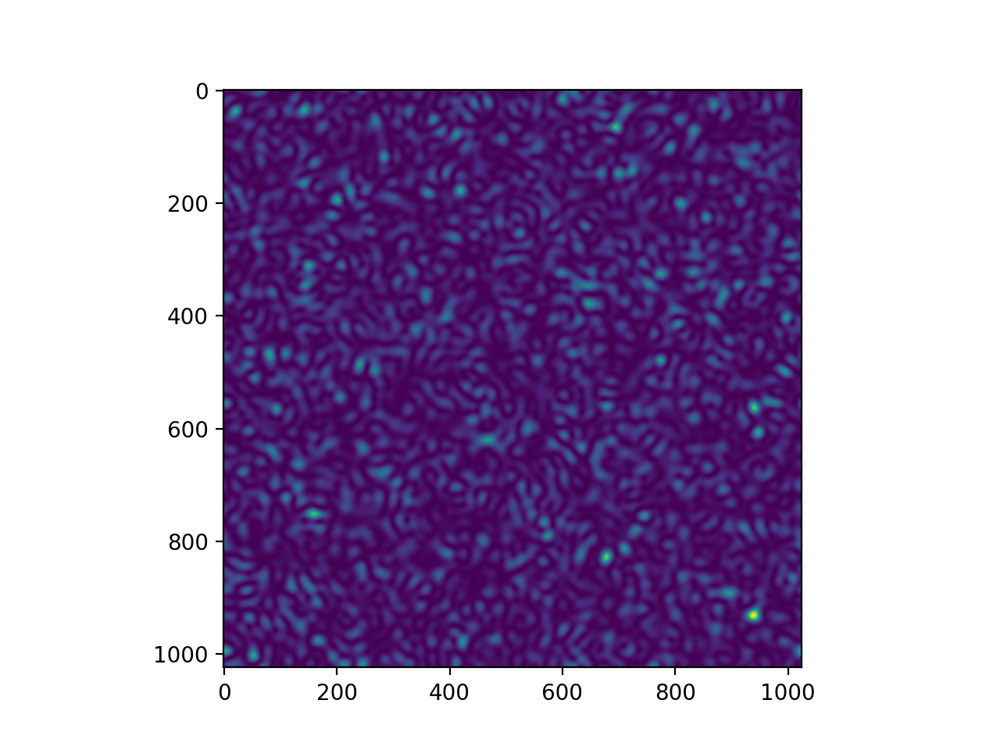

(1024, 1024)


<IPython.core.display.Javascript object>


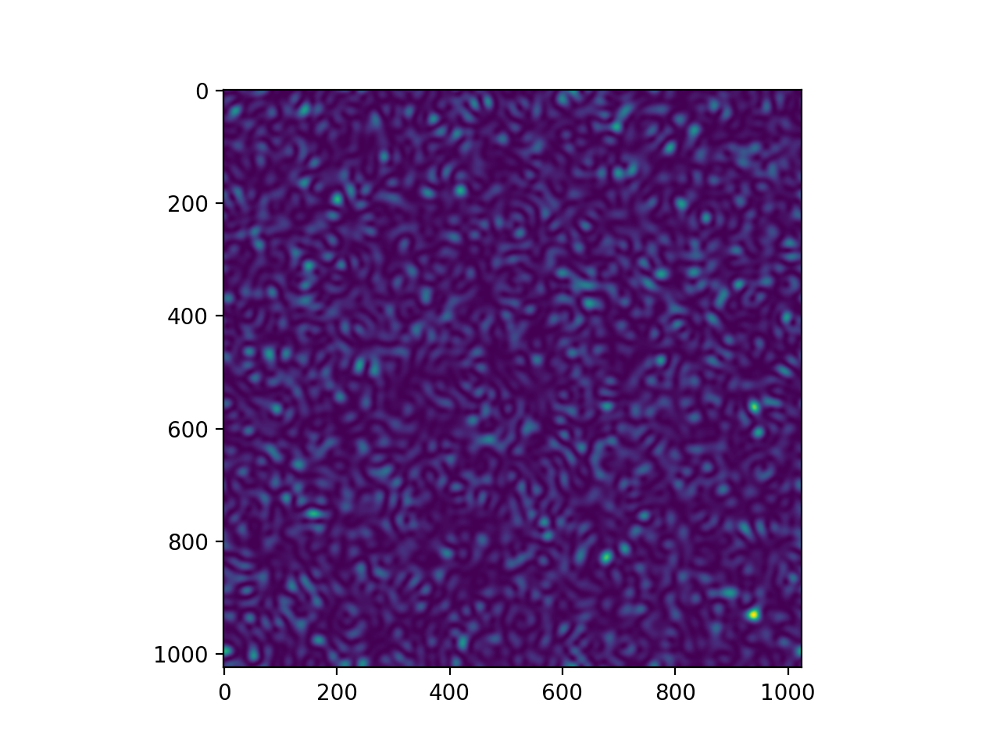

(1024, 1024)


<IPython.core.display.Javascript object>


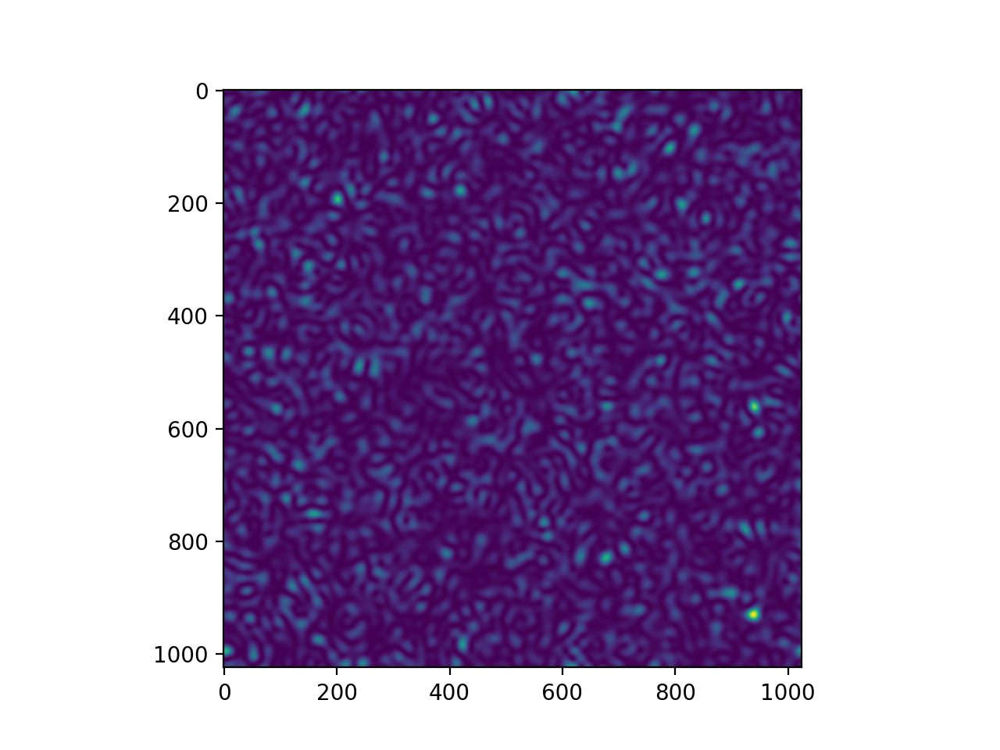

(1024, 1024)


<IPython.core.display.Javascript object>


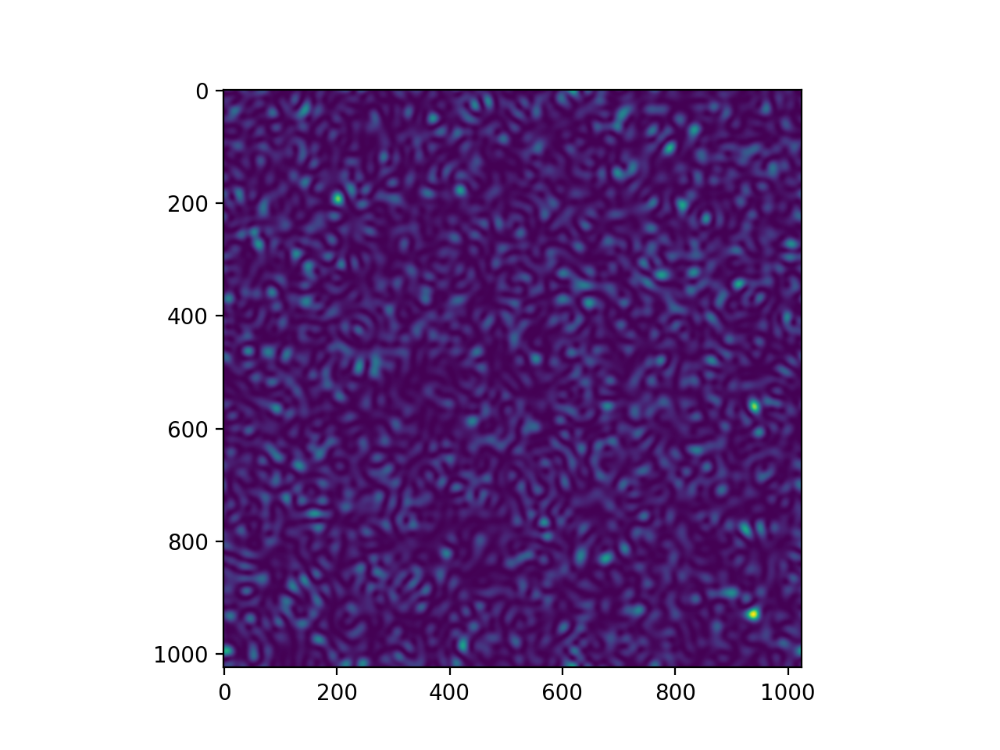

(1024, 1024)


<IPython.core.display.Javascript object>


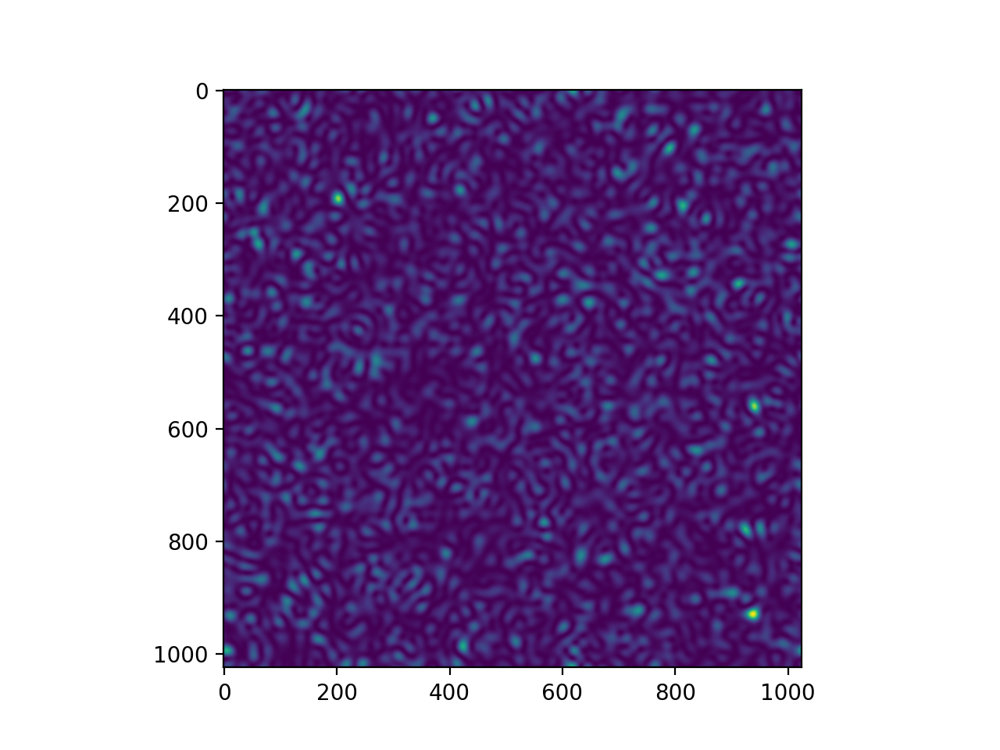

(1024, 1024)


<IPython.core.display.Javascript object>


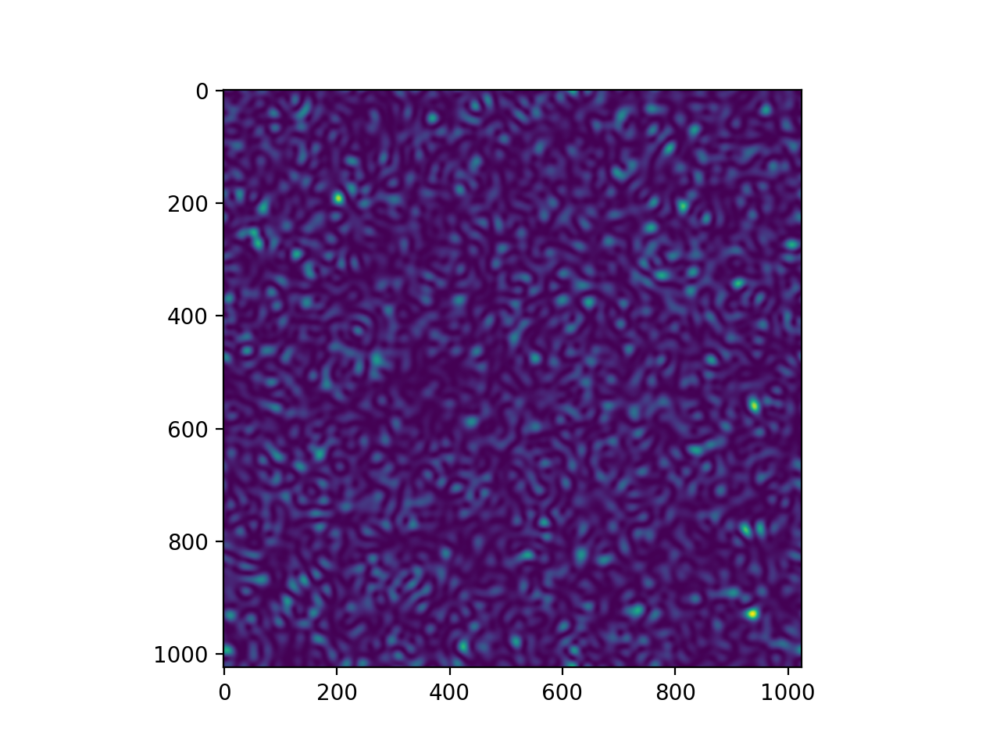

(1024, 1024)


<IPython.core.display.Javascript object>


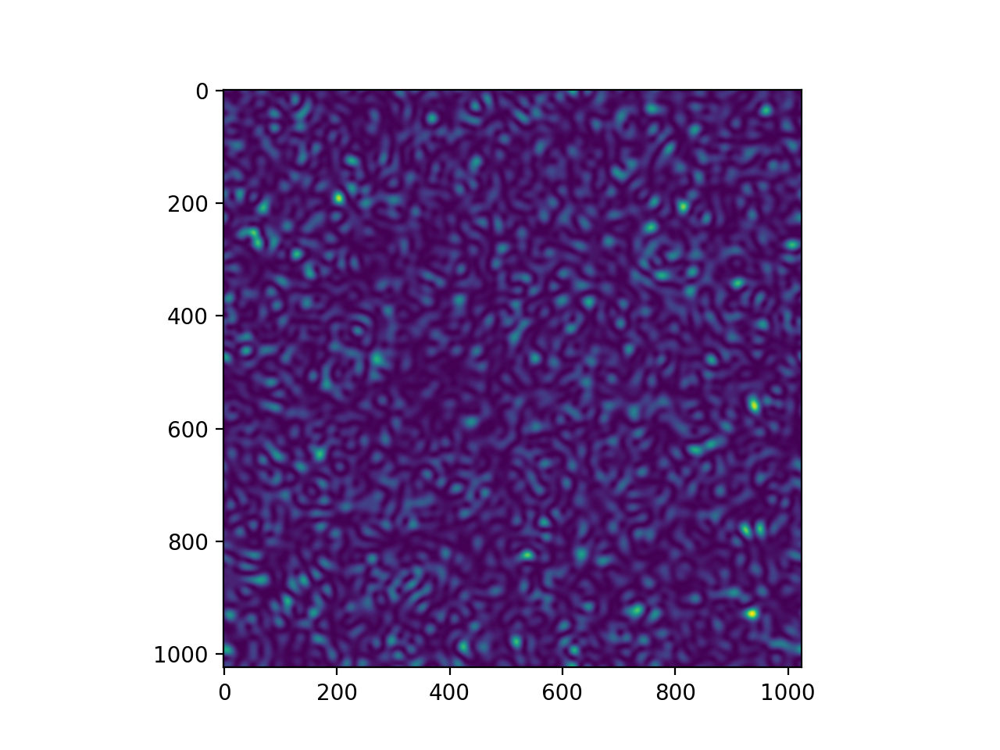

(1024, 1024)


<IPython.core.display.Javascript object>


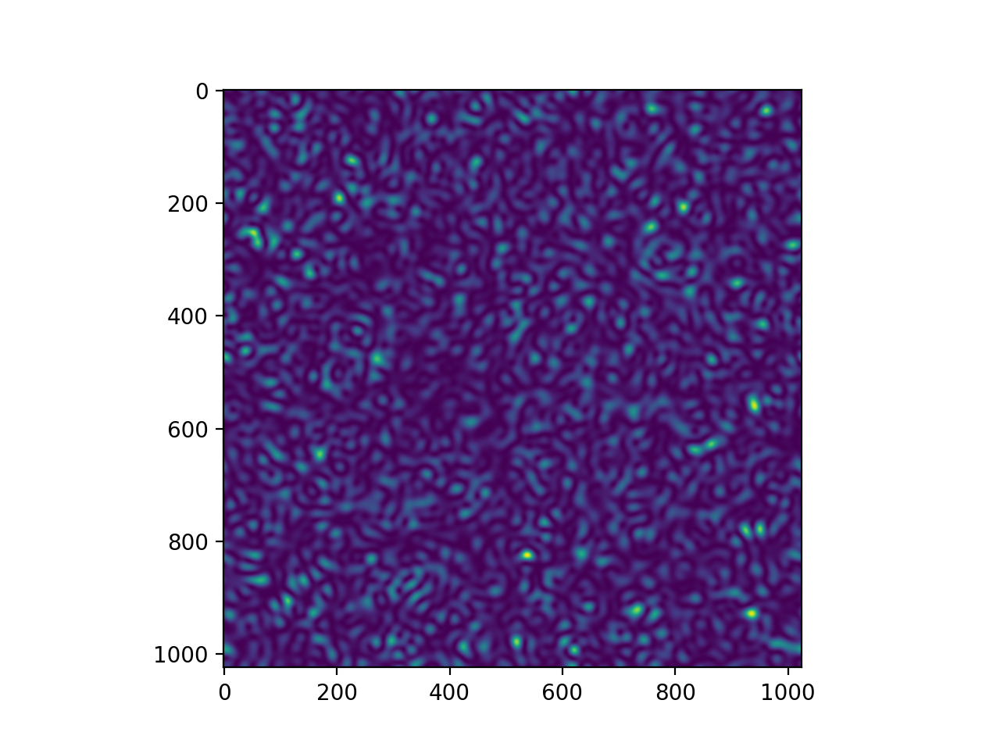

(1024, 1024)


<IPython.core.display.Javascript object>


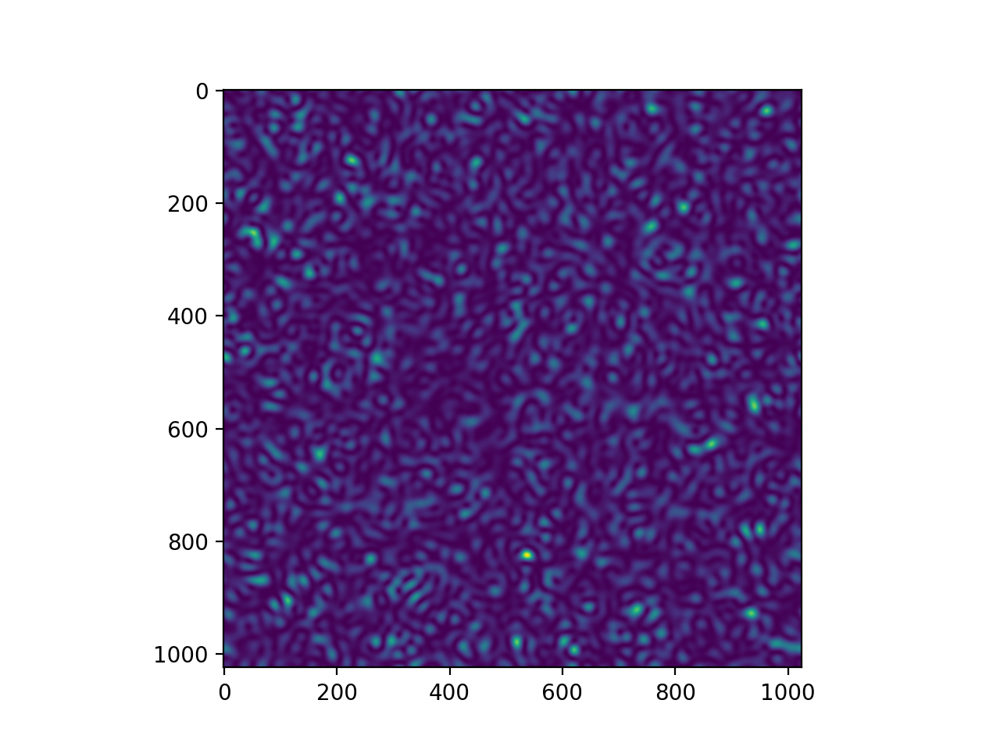

(1024, 1024)


<IPython.core.display.Javascript object>


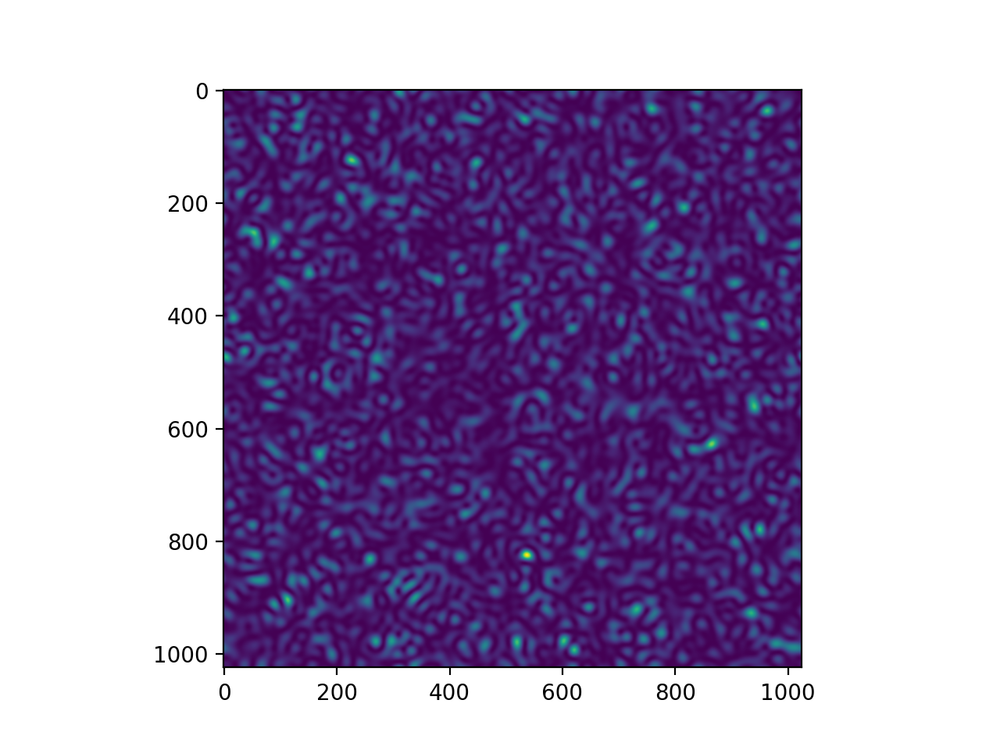

(1024, 1024)


<IPython.core.display.Javascript object>


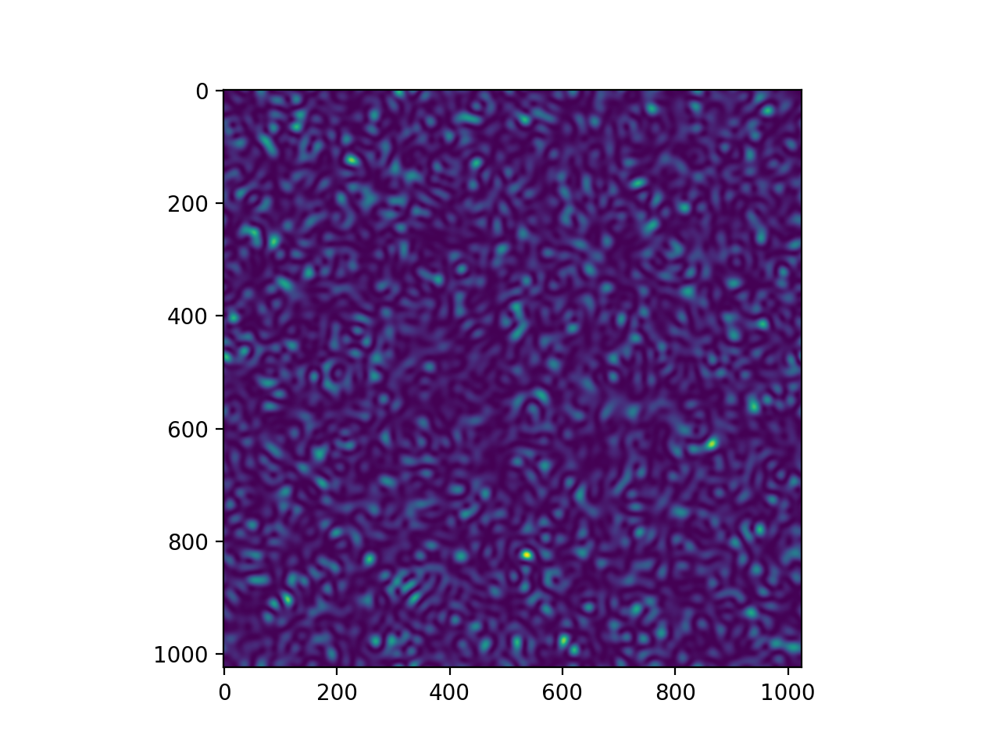

(1024, 1024)


<IPython.core.display.Javascript object>


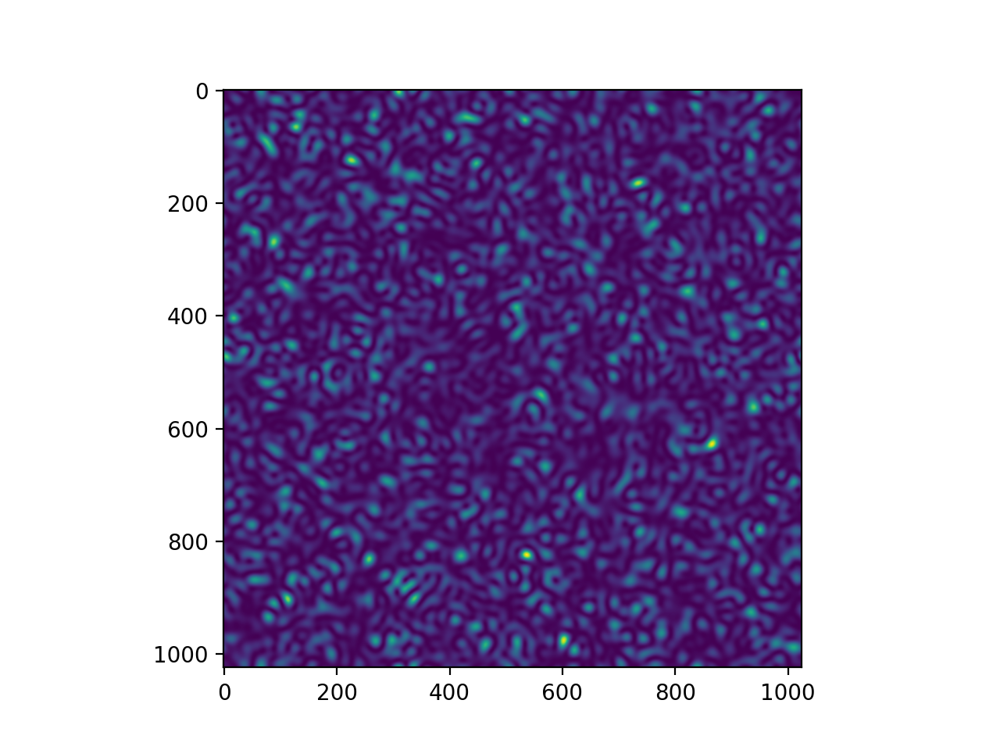

(1024, 1024)


<IPython.core.display.Javascript object>


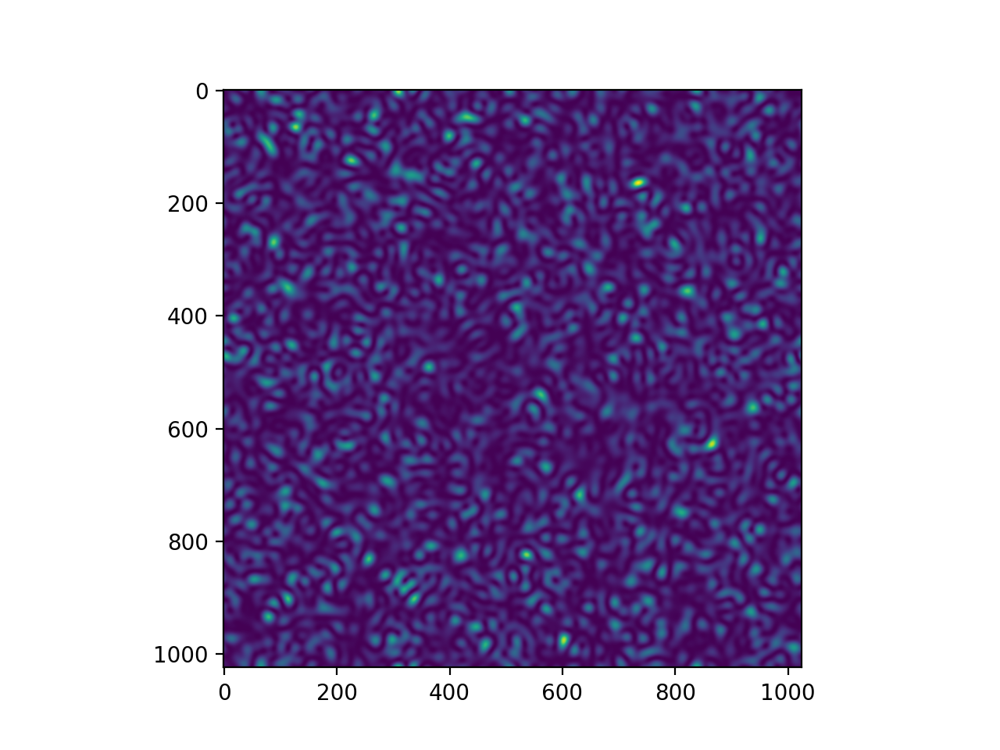

(1024, 1024)


<IPython.core.display.Javascript object>


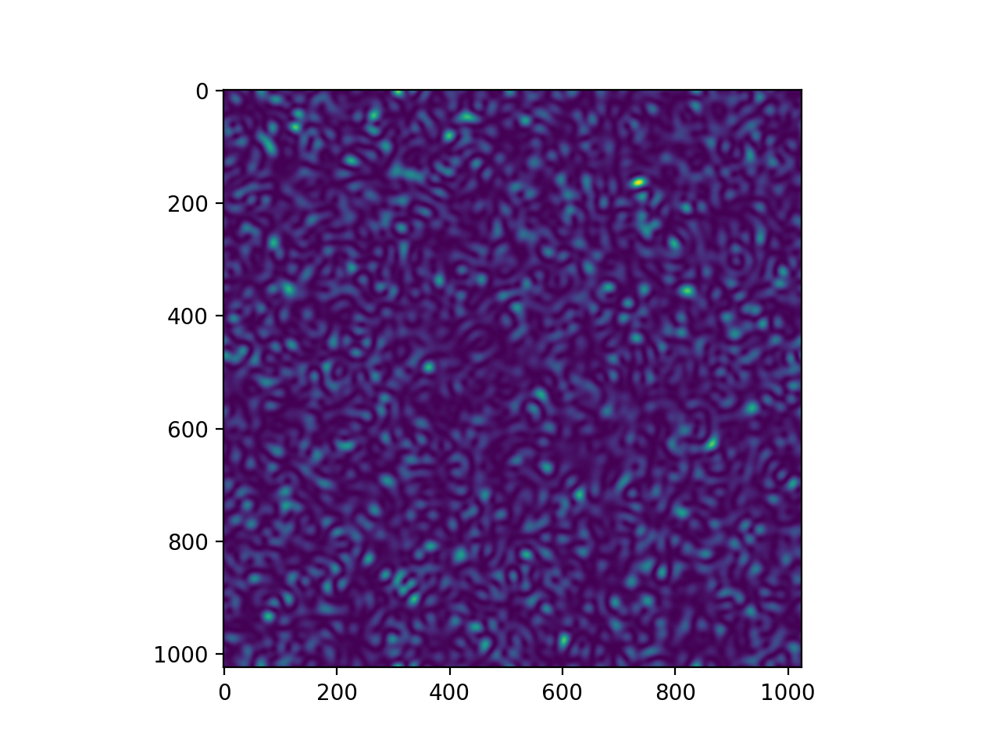

(1024, 1024)


<IPython.core.display.Javascript object>


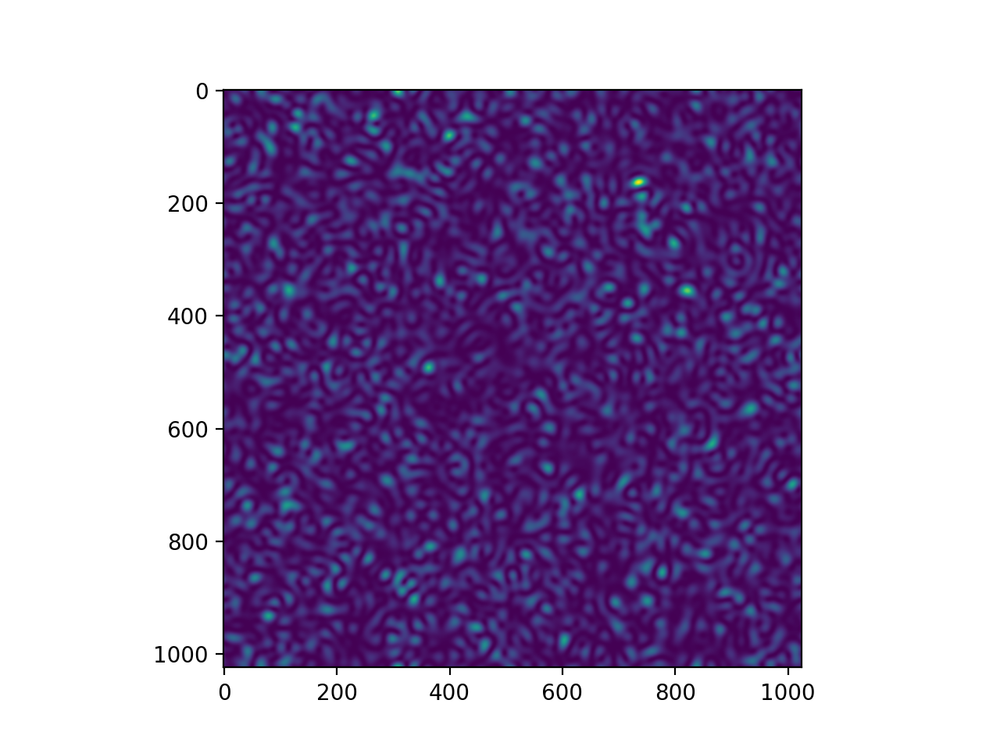

(1024, 1024)


<IPython.core.display.Javascript object>


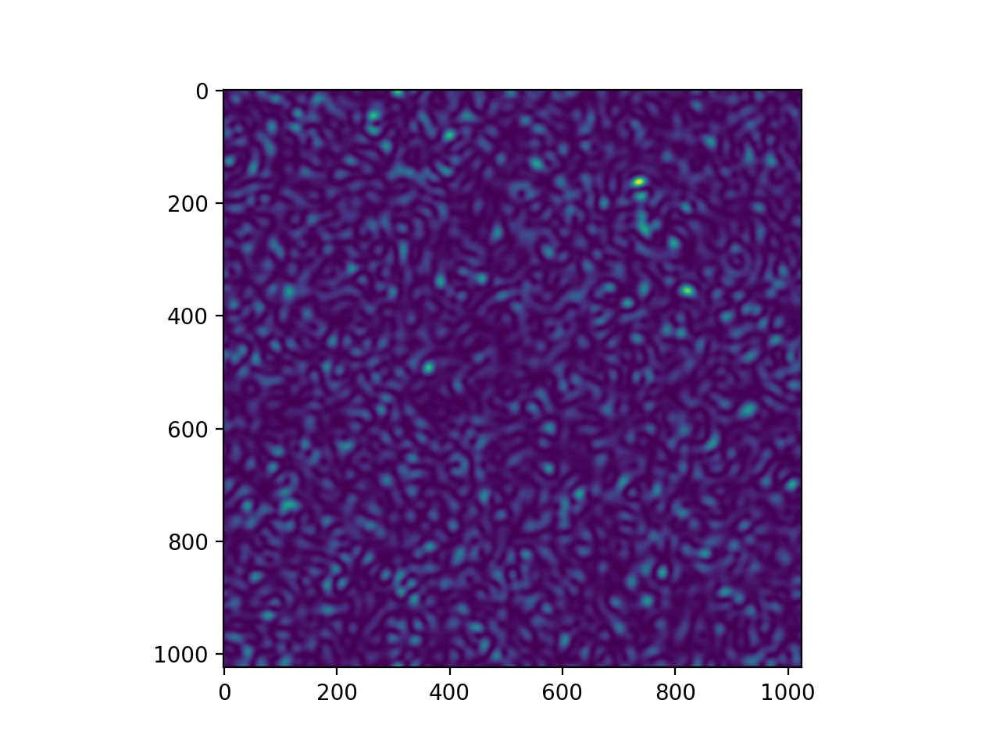

(1024, 1024)


<IPython.core.display.Javascript object>


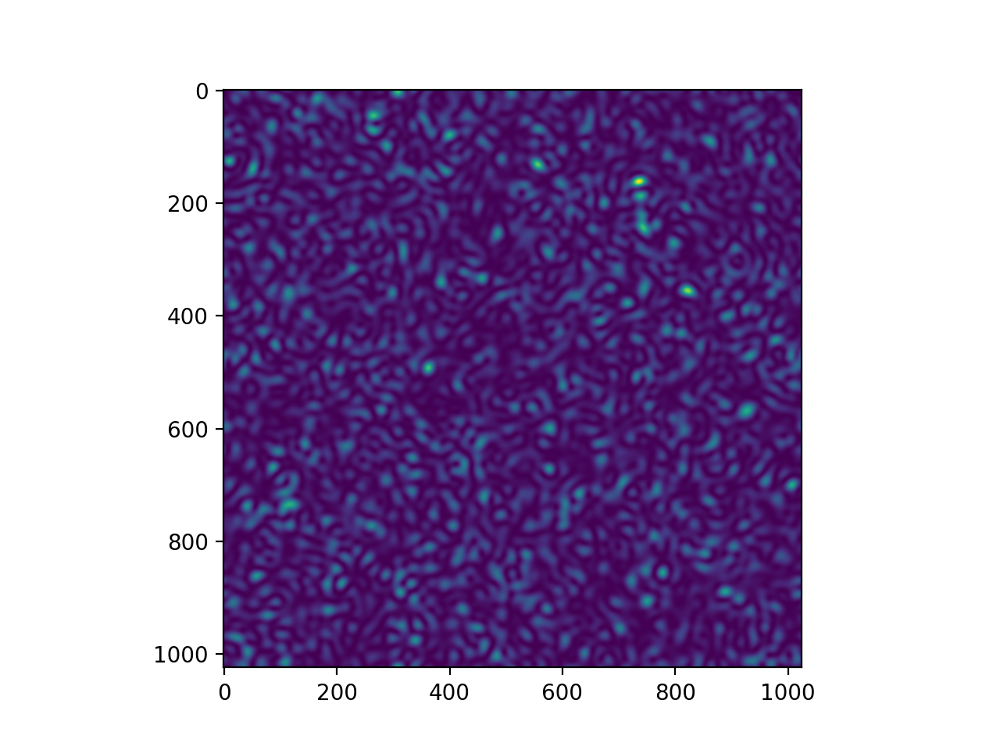

(1024, 1024)


In [10]:
plt.close('all')
for i in range(1,21):
    correlation = indexCorrelation(i)
    plt.figure()
    img1,_ = specklesCorrelatedFromPhase(phi1,phi2,30,correlation)
    plt.imshow(img1)

In [28]:
def specklesAlgorithm(img):
    """
    Modulus squared and shifted pattern
    """
    return FT.fftshift(abs(FT.fft2(img))**2)

indexCorrelation = lambda x,N,nu=2: 2*(1-((x-1)/(N-1))**nu)**2-1



class speckle:
    def __init__(self,L1,L2):
        self.L1 = L1
        self.L2 = L2
        self.size = (L1,L2)
        J,I = np.indices(self.size)
        self.J = J - J.mean()
        self.I = I - I.mean()
        self.img = np.zeros(self.size,dtype = complex)
    
    def setRadialMask(self,x0 = 0,y0 = 0):
        """Set the radial mask for the 

        Args:
            r0 (_type_): _description_
            x0 (int, optional): _description_. Defaults to 0.
            y0 (int, optional): _description_. Defaults to 0.
            
        """
        self.RR = np.sqrt((self.I-x0)**2+(self.J-x0)**2)
        
        
    def speckleFromPhase(self,r0,phi):
        """
        Generate speckle pattern from a uniform phase one
        """
        self.img = self.img*0
        self.img = np.where(RR<r0,np.exp(1j*phi),self.img)
        return specklesAlgorithm(self.img)
    
    def generate(self,r0):
        """
        Generate single speckles pattern
        """
        self.img = self.img*0
        phi = 2*np.pi*np.random.random(self.size)
        return self.speckleFromPhase(r0,phi)
    

    
    def performCorrelation(self,A,B,correlation):
        """
        Perform the correlation between 2 normal random variables 
        with 'correlation' as correlation coefficient
        """
        
        z1 = 1/np.sqrt(2)*(np.sqrt(1+correlation)*A - np.sqrt(1-correlation)*B)
        z2 = 1/np.sqrt(2)*(np.sqrt(1+correlation)*A + np.sqrt(1-correlation)*B) 
        return z1,z2
    
    def specklesCorrelatedFromPhase(self,phi1,phi2,r0,correlation):
        """
        Generation of correlated speckles from normal phase already determined
        """
        z1,z2 = self.performCorrelation(phi1,phi2,correlation)
        t1 = norm.cdf(z1)
        t2 = norm.cdf(z2)
        img1 = speckleFromPhase(r0,2*np.pi*t1)
        img2 = speckleFromPhase(r0,2*np.pi*t2)
        return img1,img2
    
    
    def specklesCorrelated(self,r0,correlation):
        """
        Generation of correlated speckles from phase
        """
        phi1 = rng.normal(size = self.size)
        phi2 = rng.normal(size = self.size)
        return self.specklesCorrelatedFromPhase(phi1,phi2,r0,correlation)
    
    def setTimeSerie(self):
        """
        Save the first pattern and the target pattern.
        """
        self.img1 = rng.normal(size = self.size)
        self.img2 = rng.normal(size = self.size)
        
    def specklesTimeSeries(self,r0,k,N,nu = 2):
        """
        Perform the correlation and evaluate the evolution.
        """
        if not hasattr(self,'img1'):
            self.setTimeSerie()
        correlation = indexCorrelation(k,N,nu)
        img1,_  = self.specklesCorrelatedFromPhase(self.img1,self.img2,r0,correlation)
        return img1

(1024, 1024)


<IPython.core.display.Javascript object>


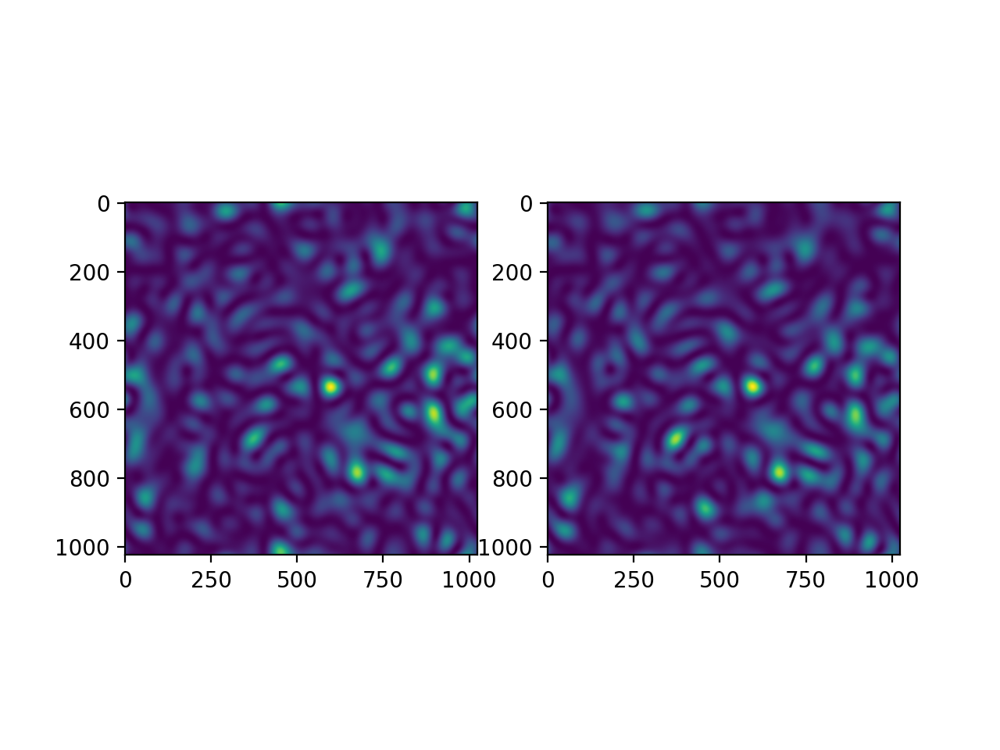

In [29]:
plt.close('all')
A,B = specklesCorrelated(10,0.99)
plt.figure()
plt.subplot(121)
plt.imshow(A)
plt.subplot(122)
plt.imshow(B)

In [30]:
S = speckle(L,L)
S.setRadialMask()

<IPython.core.display.Javascript object>


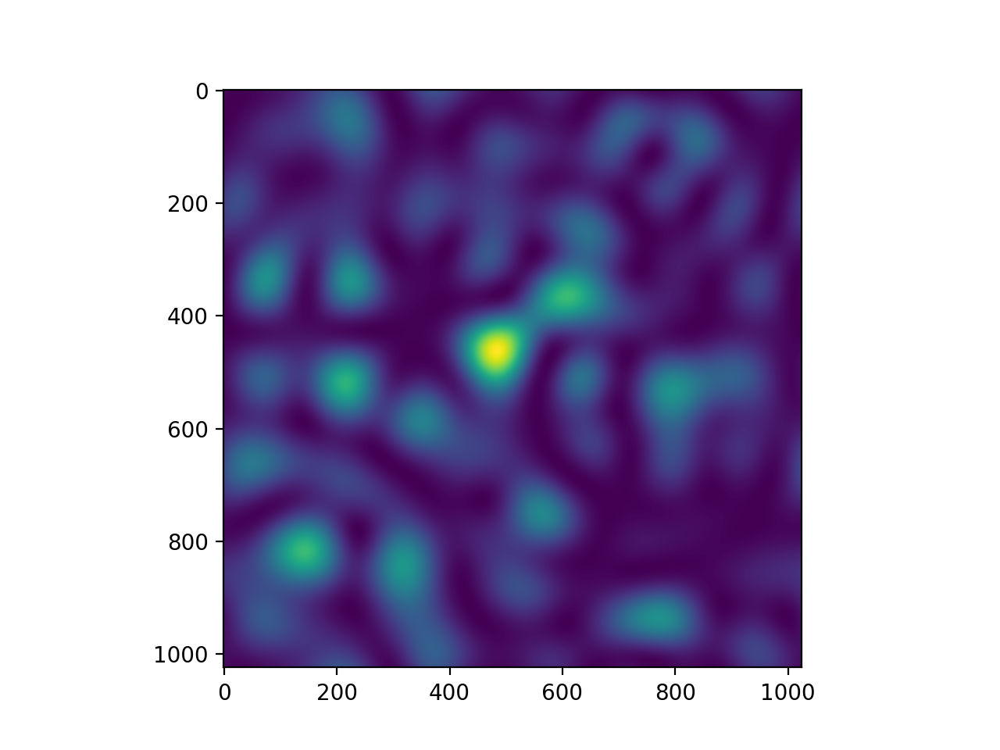

In [22]:
img = S.generate(5)
img = (img-img.min())/img.ptp()
plt.figure()
plt.imshow(img)

In [38]:
h,w = S.size
mov = Video(w,h,'speckle.mp4',fps = 10, mode= "MONO8",compression = 1)
N = 20
r0 = 100
convertUint8 = lambda x : 255*((x-x.min())/x.ptp()).astype(np.uint8)
S.setTimeSerie()
nu = 1 
try:
    for i in range(1,N+1):
        img = S.specklesTimeSeries(r0,i,N,nu)
        mov.append(conv2uint8(img))
        print("\r%.2f"%((i+1)/(N+1)*100),end = "")
    raise KeyboardInterrupt

except KeyboardInterrupt:
    mov.close()

100.00

In [32]:
mov.close()